## **StrawHat Scientists Guild Members**

<b>Saketh Sai Vootla</b> NUID: 001568984<br>
<b>Pravin Dhuri</b> NUID: 002138314 <br>
<b>Vishnu Raj Rajagopal</b> NUID: 001520806

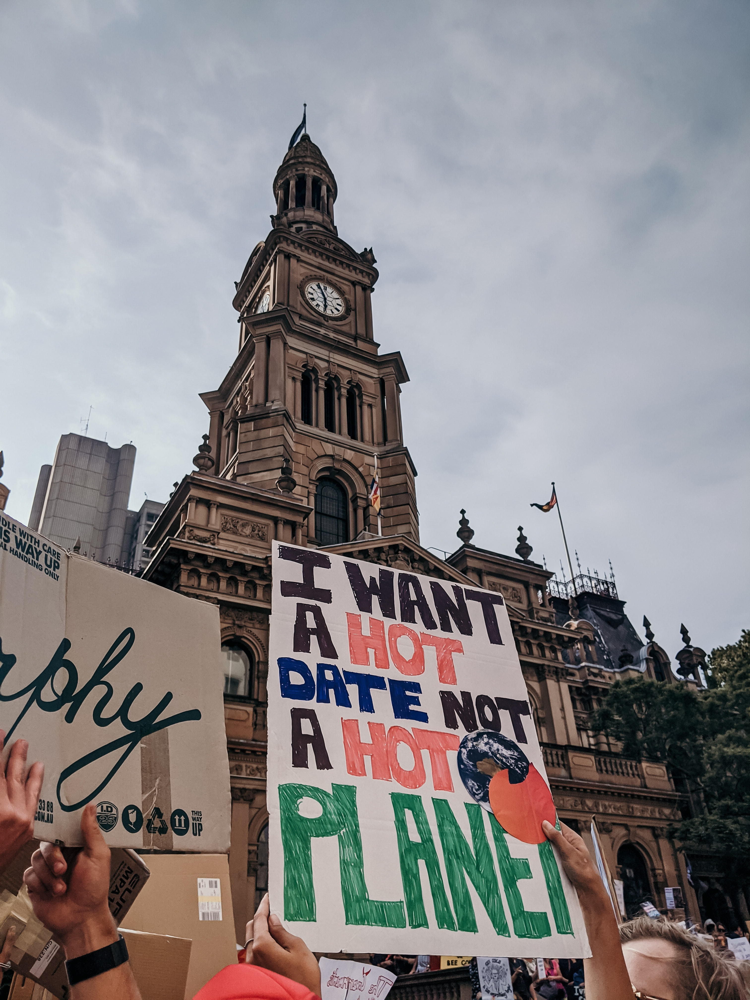

## Introduction

The goal of this project is to forecast temperature change based on prior temperature change trends acquired from the data set.

In [1]:
# import libraries 

# data cleaning
import pandas as pd
from pandas import read_csv
from pandas import datetime
import numpy as np


#data visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from matplotlib import pyplot
import plotly.offline as pyo
import plotly.graph_objs as go

#Stats Modeling
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA, ARMAResults
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
import ipywidgets as widgets

#visualazation libraries
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import chart_studio.plotly as ch
import seaborn as sns



# import numpy as np
# import matplotlib.pyplot as plt
# from sklearn.model_selection import train_test_split
# from sklearn.linear_model import LinearRegression
# from sklearn.preprocessing import PolynomialFeatures
# from sklearn.metrics import r2_score

# hide warnings
import warnings
warnings.simplefilter("ignore")


# Set notebook mode to work in offline

pyo.init_notebook_mode()

<ipython-input-1-9114b46e8ca7>:6: FutureWarning: The pandas.datetime class is deprecated and will be removed from pandas in a future version. Import from datetime module instead.
  from pandas import datetime


In [2]:
pwd!

'C:\\Users\\sunny\\Data Science - Dino'

In [3]:
df = pd.read_csv("Environment_Temperature_change_E_All_Data_NOFLAG.csv", encoding='latin-1')

In [4]:
df_countrycode=pd.read_csv('FAOSTAT_data_12-4-2021.csv')

## Gathering Data

The Global Surface Temperature Change data distributed by the National Aeronautics and Space Administration Goddard Institute for Space Studies (NASA-GISS) is publicly available.

Data in the Temperature Change domain can be reachable from the Food and Agriculture Organization of the United Nations' [web data portal](https://www.fao.org/faostat/en/#data/ET). 

The FAOSTAT Temperature Change domain shows statistics of mean surface temperature change by country, with annual updates. The below data covers the time period of 1961–2019. Statistics are available for monthly and annual mean temperature anomalies, i.e., temperature change with respect to a baseline climatology.<br> It includes areas of all the countries and territories of the world. (In 2019: 190 countries and 37 other territorial entities) The data covers monthly and yearly temperature changes as Celsius degrees °C between 1961 and 2019. The frequency of dissemination and Release calendar of the data is the yearly base.<br>
While the first seven columns include information about temperature changes, the other columns show temperature change numbers between 1961 and 2019. And, all years have some missing values. When we examined the first seven columns, below are the description of the columns<br>

**Area Code**: The numerical code of area column, type of area code is an integer.<br>
**Area**: Countries and Territories (In 2019: 190 countries and 37 other territorial entities.), type of area is an object.<br>
**Months Code**: The numerical code of months column, type of months code is an integer.<br>
**Months**: Months, Seasons, Meteorological year, type of months is an object.<br>
    **Months**: 'January', 'February', 'March', 'April', 'May', 'June', 'July','August', 'September', 'October', 'November', 'December' <br>
    **Seasons**: 'Dec\x96Jan\x96Feb', 'Mar\x96Apr\x96May', 'Jun\x96Jul\x96Aug','Sep\x96Oct\x96Nov'<br>
    **Year**: 'Meteorological year'
<br>
**Element Code**: The numerical code of element column, type of element code is an integer.<br>
**Element**: 'Temperature change', 'Standard Deviation', type of element is an object.<br>
**Unit**: Celsius degrees °C, type of unit is an object.

In [5]:
df

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020
0,2,Afghanistan,7001,January,7271,Temperature change,°C,0.746,0.009,2.695,...,1.312,-0.437,1.366,1.808,1.985,3.561,1.386,2.120,3.187,-0.472
1,2,Afghanistan,7001,January,6078,Standard Deviation,°C,1.947,1.947,1.947,...,1.947,1.947,1.947,1.947,1.947,1.947,1.947,1.947,1.947,1.947
2,2,Afghanistan,7002,February,7271,Temperature change,°C,-1.792,2.397,3.863,...,0.448,-2.994,1.634,-3.111,2.750,2.390,-0.077,2.820,0.334,2.668
3,2,Afghanistan,7002,February,6078,Standard Deviation,°C,2.590,2.590,2.590,...,2.590,2.590,2.590,2.590,2.590,2.590,2.590,2.590,2.590,2.590
4,2,Afghanistan,7003,March,7271,Temperature change,°C,0.458,1.281,0.375,...,0.877,-0.309,2.379,0.026,-0.500,2.490,0.975,4.536,0.471,0.731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9685,5873,OECD,7018,JunJulAug,6078,Standard Deviation,°C,0.247,0.247,0.247,...,0.247,0.247,0.247,0.247,0.247,0.247,0.247,0.247,0.247,0.247
9686,5873,OECD,7019,SepOctNov,7271,Temperature change,°C,0.045,0.464,0.663,...,1.100,0.881,1.050,1.016,1.684,1.543,1.210,0.586,1.239,1.393
9687,5873,OECD,7019,SepOctNov,6078,Standard Deviation,°C,0.379,0.379,0.379,...,0.379,0.379,0.379,0.379,0.379,0.379,0.379,0.379,0.379,0.379
9688,5873,OECD,7020,Meteorological year,7271,Temperature change,°C,0.171,-0.007,0.136,...,0.800,1.273,0.992,0.828,1.292,1.872,1.367,1.101,1.308,1.442


In [6]:
df_countrycode

,Country Code,Country,M49 Code,ISO2 Code,ISO3 Code,Start Year,End Year
0,2,Afghanistan,4.0,AF,AFG,NaN,NaN
1,3,Albania,8.0,AL,ALB,NaN,NaN
2,4,Algeria,12.0,DZ,DZA,NaN,NaN
3,5,American Samoa,16.0,AS,ASM,NaN,NaN
4,6,Andorra,20.0,AD,AND,NaN,NaN
...,...,...,...,...,...,...,...
279,5815,Low Income Food Deficit Countries,901.0,NaN,NaN,NaN,NaN
280,5817,Net Food Importing Developing Countries,902.0,NaN,NaN,NaN,NaN
281,5848,Annex I countries,NaN,NaN,NaN,NaN,NaN
282,5849,Non-Annex I countries,NaN,NaN,NaN,NaN,NaN


## Data Wrangling

The Data set FAOSTAT_data have country codes([ISO 3166 standard published by the International Organization for Standardizationⁱ](https://en.wikipedia.org/wiki/ISO_3166-1_alpha-3) ). We added this from another CSV that is provided by FAOSTAT. So, we added this ISO-3 codes in my data set as 'CountryCode'.<br> Additionally, we also encountered some text formatting issues with 'Months' and 'year'. Only a small amount of cleaning and wrangling was necessary to achieve the visualizations.<br>

### My cleaning and wrangling activities included:

**Data columns and some rows rename**:<br>
We changed the 'Area' columns to 'country names' because it will be key in merging the data sets. <br> we categorized the seasons according to the months:<br>'Dec\x96Jan\x96Feb' → 'Winter', 'Mar\x96Apr\x96May' → 'Spring', 'Jun\x96Jul\x96Aug' → 'Summer','Sep\x96Oct\x96Nov'→'Fall'. Because year was written like 'Y1961', We splitted 'Y' and using the other part of 'year'.

**Deleting of columns and some rows**:<br>
The 'Area Code', 'Months','Elemet Code' columns are a unique identifier of each row which does not give any useful statistical information. And, each of the 'Unit' column show 'Celsius degrees °C' so we do not need this information as a column. Also, in this analysis we did not use 'Standart Deviation', so after filtering all 'Temperature change' rows, the 'Element' column also deleted.

**Manipulating data frame**:<br>
As we mentioned earlier we have added ISO-3 CountryCode in the data. We merged 'CountryCode' within the data set. for better Visulizations and analysis we had gathered all the years into a single Year column.




In [7]:
#examine each column and find unique items of Months and Element columns
display(df.head(5))
print('\n')
#display(df.info())
print('\n')
print("Months")
display(df.Months.unique())
print('\n')
print("Elements")
display(df.Element.unique())
print('\n')
display(df_countrycode.head(5))

,Area Code,Area,Months Code,Months,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020
0,2,Afghanistan,7001,January,7271,Temperature change,°C,0.746,0.009,2.695,...,1.312,-0.437,1.366,1.808,1.985,3.561,1.386,2.120,3.187,-0.472
1,2,Afghanistan,7001,January,6078,Standard Deviation,°C,1.947,1.947,1.947,...,1.947,1.947,1.947,1.947,1.947,1.947,1.947,1.947,1.947,1.947
2,2,Afghanistan,7002,February,7271,Temperature change,°C,-1.792,2.397,3.863,...,0.448,-2.994,1.634,-3.111,2.750,2.390,-0.077,2.820,0.334,2.668
3,2,Afghanistan,7002,February,6078,Standard Deviation,°C,2.590,2.590,2.590,...,2.590,2.590,2.590,2.590,2.590,2.590,2.590,2.590,2.590,2.590
4,2,Afghanistan,7003,March,7271,Temperature change,°C,0.458,1.281,0.375,...,0.877,-0.309,2.379,0.026,-0.500,2.490,0.975,4.536,0.471,0.731






Months


array(['January', 'February', 'March', 'April', 'May', 'June', 'July',
       'August', 'September', 'October', 'November', 'December',
       'Dec\x96Jan\x96Feb', 'Mar\x96Apr\x96May', 'Jun\x96Jul\x96Aug',
       'Sep\x96Oct\x96Nov', 'Meteorological year'], dtype=object)



Elements


array(['Temperature change', 'Standard Deviation'], dtype=object)

,Country Code,Country,M49 Code,ISO2 Code,ISO3 Code,Start Year,End Year
0,2,Afghanistan,4.0,AF,AFG,NaN,NaN
1,3,Albania,8.0,AL,ALB,NaN,NaN
2,4,Algeria,12.0,DZ,DZA,NaN,NaN
3,5,American Samoa,16.0,AS,ASM,NaN,NaN
4,6,Andorra,20.0,AD,AND,NaN,NaN


In [8]:
df.describe()

,Area Code,Months Code,Element Code,Y1961,Y1962,Y1963,Y1964,Y1965,Y1966,Y1967,...,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020
count,9690.000000,9690.000000,9690.000000,8284.000000,8320.000000,8292.000000,8250.000000,8251.000000,8350.000000,8314.000000,...,8433.000000,8392.000000,8490.000000,8423.000000,8405.000000,8397.000000,8431.000000,8412.000000,8415.000000,8389.000000
mean,838.947368,7009.882353,6674.500000,0.403626,0.313035,0.318835,0.268446,0.220420,0.381434,0.268280,...,0.756416,0.776112,0.815099,0.905409,1.007698,1.069965,0.991761,1.002790,1.084456,1.115413
std,1801.260264,6.038254,596.530782,0.702626,0.714701,0.854777,0.749811,0.738612,0.735656,0.723296,...,0.758856,0.858479,0.714088,0.817075,0.842124,0.875731,0.808237,0.875453,0.850832,0.953079
min,1.000000,7001.000000,6078.000000,-4.054000,-5.385000,-8.485000,-7.248000,-4.729000,-8.150000,-6.531000,...,-4.962000,-5.721000,-3.769000,-5.368000,-4.022000,-3.294000,-3.460000,-2.193000,-2.636000,-4.012000
25%,79.000000,7005.000000,6078.000000,0.061750,-0.035000,0.042000,-0.106000,-0.208500,0.072000,-0.158000,...,0.357000,0.362000,0.396000,0.409000,0.430000,0.455000,0.441000,0.419000,0.450500,0.448000
50%,154.000000,7009.000000,6674.500000,0.365000,0.330000,0.357000,0.326500,0.298000,0.361000,0.310000,...,0.616000,0.635000,0.696000,0.726000,0.830000,0.926000,0.848000,0.799000,0.918000,0.938000
75%,227.000000,7016.000000,7271.000000,0.678000,0.624000,0.646000,0.605000,0.584000,0.658000,0.601750,...,1.089000,1.101000,1.114000,1.180500,1.380000,1.482000,1.349000,1.342250,1.497500,1.500000
max,5873.000000,7020.000000,7271.000000,5.770000,4.373000,4.765000,5.251000,5.153000,5.771000,4.762000,...,6.558000,10.827000,6.735000,11.759000,7.583000,10.170000,7.392000,9.114000,7.096000,8.720000


In [9]:
#1 Renaming the column names

df.rename(columns = {'Area':'CountryName'},inplace = True)
df.set_index('Months', inplace=True)
df.rename({'Dec\x96Jan\x96Feb': 'Winter', 'Mar\x96Apr\x96May': 'Spring', 'Jun\x96Jul\x96Aug':'Summer','Sep\x96Oct\x96Nov':'Fall'}, axis='index',inplace = True)
df.reset_index(inplace = True)
df

,Months,Area Code,CountryName,Months Code,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020
0,January,2,Afghanistan,7001,7271,Temperature change,°C,0.746,0.009,2.695,...,1.312,-0.437,1.366,1.808,1.985,3.561,1.386,2.120,3.187,-0.472
1,January,2,Afghanistan,7001,6078,Standard Deviation,°C,1.947,1.947,1.947,...,1.947,1.947,1.947,1.947,1.947,1.947,1.947,1.947,1.947,1.947
2,February,2,Afghanistan,7002,7271,Temperature change,°C,-1.792,2.397,3.863,...,0.448,-2.994,1.634,-3.111,2.750,2.390,-0.077,2.820,0.334,2.668
3,February,2,Afghanistan,7002,6078,Standard Deviation,°C,2.590,2.590,2.590,...,2.590,2.590,2.590,2.590,2.590,2.590,2.590,2.590,2.590,2.590
4,March,2,Afghanistan,7003,7271,Temperature change,°C,0.458,1.281,0.375,...,0.877,-0.309,2.379,0.026,-0.500,2.490,0.975,4.536,0.471,0.731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9685,Summer,5873,OECD,7018,6078,Standard Deviation,°C,0.247,0.247,0.247,...,0.247,0.247,0.247,0.247,0.247,0.247,0.247,0.247,0.247,0.247
9686,Fall,5873,OECD,7019,7271,Temperature change,°C,0.045,0.464,0.663,...,1.100,0.881,1.050,1.016,1.684,1.543,1.210,0.586,1.239,1.393
9687,Fall,5873,OECD,7019,6078,Standard Deviation,°C,0.379,0.379,0.379,...,0.379,0.379,0.379,0.379,0.379,0.379,0.379,0.379,0.379,0.379
9688,Meteorological year,5873,OECD,7020,7271,Temperature change,°C,0.171,-0.007,0.136,...,0.800,1.273,0.992,0.828,1.292,1.872,1.367,1.101,1.308,1.442


In [10]:
#2 Filtering the Element Column

df = df[df['Element'] == 'Temperature change']
df

,Months,Area Code,CountryName,Months Code,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2011,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020
0,January,2,Afghanistan,7001,7271,Temperature change,°C,0.746,0.009,2.695,...,1.312,-0.437,1.366,1.808,1.985,3.561,1.386,2.120,3.187,-0.472
2,February,2,Afghanistan,7002,7271,Temperature change,°C,-1.792,2.397,3.863,...,0.448,-2.994,1.634,-3.111,2.750,2.390,-0.077,2.820,0.334,2.668
4,March,2,Afghanistan,7003,7271,Temperature change,°C,0.458,1.281,0.375,...,0.877,-0.309,2.379,0.026,-0.500,2.490,0.975,4.536,0.471,0.731
6,April,2,Afghanistan,7004,7271,Temperature change,°C,-1.750,0.062,0.885,...,1.851,1.645,0.085,0.718,1.750,1.047,1.378,1.565,1.136,0.191
8,May,2,Afghanistan,7005,7271,Temperature change,°C,1.357,-0.144,-0.741,...,3.787,1.141,1.337,1.095,2.015,3.380,3.447,0.975,0.674,1.271
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9680,Winter,5873,OECD,7016,7271,Temperature change,°C,0.565,-0.358,-0.216,...,0.760,1.708,1.322,0.701,1.312,2.668,1.913,1.465,1.555,2.099
9682,Spring,5873,OECD,7017,7271,Temperature change,°C,-0.029,-0.191,0.143,...,0.394,1.445,0.481,0.806,1.204,1.961,1.251,1.264,1.363,0.958
9684,Summer,5873,OECD,7018,7271,Temperature change,°C,0.104,0.055,-0.044,...,0.947,1.058,1.115,0.787,0.968,1.313,1.092,1.090,1.077,1.319
9686,Fall,5873,OECD,7019,7271,Temperature change,°C,0.045,0.464,0.663,...,1.100,0.881,1.050,1.016,1.684,1.543,1.210,0.586,1.239,1.393


In [11]:
#3 Dropping unwanted columns from df_countrycode

df_countrycode.drop(['Country Code','M49 Code','ISO2 Code','Start Year','End Year'],axis=1,inplace=True)
df_countrycode.rename(columns = {'Country':'CountryName','ISO3 Code':'CountryCode'},inplace=True)
df_countrycode

,CountryName,CountryCode
0,Afghanistan,AFG
1,Albania,ALB
2,Algeria,DZA
3,American Samoa,ASM
4,Andorra,AND
...,...,...
279,Low Income Food Deficit Countries,NaN
280,Net Food Importing Developing Countries,NaN
281,Annex I countries,NaN
282,Non-Annex I countries,NaN


In [12]:
#4 Merging with df to df_country

df = pd.merge(df, df_countrycode, how='outer', on='CountryName')
df

,Months,Area Code,CountryName,Months Code,Element Code,Element,Unit,Y1961,Y1962,Y1963,...,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020,CountryCode
0,January,2,Afghanistan,7001,7271,Temperature change,°C,0.746,0.009,2.695,...,-0.437,1.366,1.808,1.985,3.561,1.386,2.120,3.187,-0.472,AFG
1,February,2,Afghanistan,7002,7271,Temperature change,°C,-1.792,2.397,3.863,...,-2.994,1.634,-3.111,2.750,2.390,-0.077,2.820,0.334,2.668,AFG
2,March,2,Afghanistan,7003,7271,Temperature change,°C,0.458,1.281,0.375,...,-0.309,2.379,0.026,-0.500,2.490,0.975,4.536,0.471,0.731,AFG
3,April,2,Afghanistan,7004,7271,Temperature change,°C,-1.750,0.062,0.885,...,1.645,0.085,0.718,1.750,1.047,1.378,1.565,1.136,0.191,AFG
4,May,2,Afghanistan,7005,7271,Temperature change,°C,1.357,-0.144,-0.741,...,1.141,1.337,1.095,2.015,3.380,3.447,0.975,0.674,1.271,AFG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4840,Winter,5873,OECD,7016,7271,Temperature change,°C,0.565,-0.358,-0.216,...,1.708,1.322,0.701,1.312,2.668,1.913,1.465,1.555,2.099,NaN
4841,Spring,5873,OECD,7017,7271,Temperature change,°C,-0.029,-0.191,0.143,...,1.445,0.481,0.806,1.204,1.961,1.251,1.264,1.363,0.958,NaN
4842,Summer,5873,OECD,7018,7271,Temperature change,°C,0.104,0.055,-0.044,...,1.058,1.115,0.787,0.968,1.313,1.092,1.090,1.077,1.319,NaN
4843,Fall,5873,OECD,7019,7271,Temperature change,°C,0.045,0.464,0.663,...,0.881,1.050,1.016,1.684,1.543,1.210,0.586,1.239,1.393,NaN


In [13]:
#5 Drop unwanted columns

df.drop(['Area Code','Months Code','Element Code','Element','Unit'],axis=1,inplace=True)
df

,Months,CountryName,Y1961,Y1962,Y1963,Y1964,Y1965,Y1966,Y1967,Y1968,...,Y2012,Y2013,Y2014,Y2015,Y2016,Y2017,Y2018,Y2019,Y2020,CountryCode
0,January,Afghanistan,0.746,0.009,2.695,-5.277,1.827,3.629,-1.436,0.388,...,-0.437,1.366,1.808,1.985,3.561,1.386,2.120,3.187,-0.472,AFG
1,February,Afghanistan,-1.792,2.397,3.863,-0.251,-0.140,3.397,0.293,-2.059,...,-2.994,1.634,-3.111,2.750,2.390,-0.077,2.820,0.334,2.668,AFG
2,March,Afghanistan,0.458,1.281,0.375,1.608,-0.953,-0.068,-0.761,0.493,...,-0.309,2.379,0.026,-0.500,2.490,0.975,4.536,0.471,0.731,AFG
3,April,Afghanistan,-1.750,0.062,0.885,-0.581,-1.861,-1.190,-1.498,-0.583,...,1.645,0.085,0.718,1.750,1.047,1.378,1.565,1.136,0.191,AFG
4,May,Afghanistan,1.357,-0.144,-0.741,-0.204,-0.235,-0.185,-1.298,-1.831,...,1.141,1.337,1.095,2.015,3.380,3.447,0.975,0.674,1.271,AFG
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4840,Winter,OECD,0.565,-0.358,-0.216,0.098,-0.734,-0.276,-0.165,-0.014,...,1.708,1.322,0.701,1.312,2.668,1.913,1.465,1.555,2.099,NaN
4841,Spring,OECD,-0.029,-0.191,0.143,-0.590,-0.108,-0.080,-0.340,0.287,...,1.445,0.481,0.806,1.204,1.961,1.251,1.264,1.363,0.958,NaN
4842,Summer,OECD,0.104,0.055,-0.044,-0.114,-0.496,-0.017,-0.186,-0.438,...,1.058,1.115,0.787,0.968,1.313,1.092,1.090,1.077,1.319,NaN
4843,Fall,OECD,0.045,0.464,0.663,-0.158,-0.202,-0.294,0.323,0.218,...,0.881,1.050,1.016,1.684,1.543,1.210,0.586,1.239,1.393,NaN


In [14]:
#6 Changning dataframe organization

df = df.melt(id_vars=["CountryCode", "CountryName","Months",], var_name="year", value_name="tem_change")
df["year"] = [i.split("Y")[-1] for i in df.year]

display(df.sample(5))

,CountryCode,CountryName,Months,year,tem_change
21808,MCO,Monaco,Summer,1965,-0.482
168757,UZB,Uzbekistan,Fall,1995,1.501
56142,PSE,Palestine,September,1972,0.639
49484,NaN,Czechoslovakia,Summer,1971,0.333
70041,MYS,Malaysia,February,1975,0.066


## Exploratory Data Analysis

### **What are the ten most countries that suffer from highest temperature change mostly in the last Decade?**

In [15]:
df["tem_change"] = pd.to_numeric(df["tem_change"])

In [16]:
df_c =df.copy()
df_c.set_index("year", inplace=True)
df_c = df_c.loc[['2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020']]
df_c.reset_index(inplace = True)
df_c["tem_change"] = pd.to_numeric(df_c["tem_change"])

df_c = df_c.groupby(
   ['CountryName',]).agg(
    {
        'tem_change':'mean', 
        
    }
)
df_c.reset_index(inplace = True)
df_c = df_c.sort_values(by=['tem_change'],ascending=False).head(10)

fig = px.bar(df_c, x="CountryName", y='tem_change',color = 'CountryName' ,text='tem_change', title="Top ten countries that have highest temperature change in the last decades")
fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')

# adjusting size of graph, legend place, and background colour
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
  
    template='seaborn',
    paper_bgcolor="rgb(234, 234, 242)",
    legend=dict(
        orientation="v",
        yanchor="bottom",
        y=0.3,
        xanchor="left",
        x=1.02
))

fig.update_xaxes( tickangle = 10,
        title_text = "Countries",
        title_font = {"size": 15},
        title_standoff = 0)
fig.update_yaxes(showticklabels=False,tickmode="auto", title='Temperature Change',title_standoff = 0)

fig.show()

### **What are the ten most countries that had the lowest temperature change mostly in the last Decade?**

In [17]:
df_c =df.copy()
df_c.set_index("year", inplace=True)
df_c = df_c.loc[['2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020']]
df_c.reset_index(inplace = True)
df_c["tem_change"] = pd.to_numeric(df_c["tem_change"])



df_c = df_c.groupby(
   ['CountryName',]
).agg(
    {
        'tem_change':'mean', 
        
    }
)
df_c.reset_index(inplace = True)
df_c = df_c.sort_values(by=['tem_change'],ascending=True).head(10)

fig = px.bar(df_c, x="CountryName", y='tem_change',color = 'CountryName',text='tem_change' , title="Top ten countries that have lowest temperature change in the last decades")
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
# adjusting size of graph, legend place, and background colour
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    template='seaborn',
    paper_bgcolor="rgb(234, 234, 242)",
    legend=dict(
        orientation="v",
        yanchor="bottom",
        y=0.3,
        xanchor="left",
        x=1.02
))
fig.update_xaxes( tickangle = 10,
        title_text = "Countries",
        title_font = {"size": 15},
        title_standoff = 0)
fig.update_yaxes(showticklabels=False, title='Temperature Change')

fig.show()

## **Is there any trend between the years according to World, Annex I countries and non-Annex I countries?**

In [18]:
df0 = df[df['Months'] == 'Meteorological year'] # new data frame includes only yearly values
df1 = df0[df0['CountryName'] == 'World'] # from new data frame filtering World's data
df2 = df0[df0['CountryName'] == 'Annex I countries'] # from new data frame filtering'Annex I countries' data
df3 = df0[df0['CountryName'] == 'Non-Annex I countries'] # from new data frame filtering  'Non-Annex I countries' data

# Create traces
fig = go.Figure()
#create each categories 
fig.add_trace(go.Scatter(x = df1.year, y=df1.tem_change,
                    mode='markers',
                    name='World'))
fig.add_trace(go.Scatter(x = df2.year , y=df2.tem_change,
                    mode='lines',
                    name='Annex I countries'))
fig.add_annotation(x='59',y=2.249,
                   xref="x", yref="y",
            text="Hottest Record Temparature",
        showarrow=True,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="#ffffff"
            ),
        align="center",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-30,
        bordercolor="#c7c7c7",
        borderwidth=2,
        borderpad=4,
        bgcolor="#ff7f0e",
        opacity=0.8
        )
fig.add_trace(go.Scatter(x = df3.year , y=df3.tem_change,
                    mode='lines', name='Non-Annex I countries'))

# adjusting size of graph, legend place, and background colour
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    
    template='seaborn',
    paper_bgcolor="rgb(234, 234, 242)",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
))

fig.update_xaxes(type='category',title='Years')
fig.update_yaxes(title='Temperature Change')

fig.show()
#reference: https://plotly.com/python/line-and-scatter/

## **Is there any significant difference between seasons?**

In [19]:
df0 = df[df['CountryName'] == 'World']
df1 = df0[df0['Months'] == 'Winter']
df2 = df0[df0['Months'] == 'Spring']
df3 = df0[df0['Months'] == 'Summer']
df4 = df0[df0['Months'] == 'Fall']
import plotly.graph_objects as go

# Create traces
fig = go.Figure()
fig.add_trace(go.Scatter(x = df1['year'], y=df1.tem_change,
                    mode='lines',
                    name='Winter'))
fig.add_trace(go.Scatter(x = df2['year'] , y=df2.tem_change,
                    mode='markers',
                    name='Spring'))
fig.add_trace(go.Scatter(x = df3['year'] , y=df3.tem_change,
                    mode='lines', name='Summer'))
fig.add_trace(go.Scatter(x = df4['year'] , y=df4.tem_change,
                    mode='markers', name='Fall'))
fig.add_annotation(x='59',y=2.145,
                   xref="x", yref="y",
            text="Hottest Winter Recorded",
        showarrow=True,
        font=dict(
            family="Courier New, monospace",
            size=16,
            color="#ffffff"
            ),
        align="center",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-30,
        bordercolor="#c7c7c7",
        borderwidth=2,
        borderpad=4,
        bgcolor="#ff7f0e",
        opacity=0.8
        )
# adjusting size of graph, legend place, and background colour
fig.update_layout(
    autosize=False,
    width=1000,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    template='seaborn',
    paper_bgcolor="rgb(234, 234, 242)",
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
))
fig.update_xaxes(type='category',title='Years')
fig.update_yaxes(title='Temperature Change')

fig.show()
#reference: https://plotly.com/python/line-and-scatter/

In [20]:
df_tem_change = df.copy() 
df_tem_change = df_tem_change[df_tem_change['Months'] == 'Meteorological year'] # chosing only year data
df_tem_change.drop(['Months'],axis=1,inplace=True) # dropping Months column
df_tem_change.to_csv(r'./Temperature_change_Data.csv',index=False)

In [21]:
df_tem_change.dtypes

CountryCode     object
CountryName     object
year            object
tem_change     float64
dtype: object

In [22]:
df_map = df.copy() 
df_map = df_map[df_map['Months'] == 'Meteorological year'] # chosing yearly base data
df_map['°C'] = ['<=-1.5' if x<=(-1.5) else '<=-1.0' if (-1.5)<x<=(-1.0) else '<=0.0' if (-1.0)<x<=0.0  else '<=0.5' if 0.0<x<=0.5 else '<=1.5' if 0.5<x<=1.5 else '>1.5' if 1.5<=x<10 else 'None' for x in df_map['tem_change']]
# categorized each of temperature changes

## **What is the trend of temperature change in the world? Over the time frame [1961 - 2020]**

In [23]:
fig = px.choropleth(df_map, locations="CountryCode", # used plotly express choropleth for animation plot
                    color="°C", 
                    locationmode='ISO-3',
                    hover_name="CountryName",
                    hover_data=['tem_change'],
                    animation_frame =df_map.year,
                    labels={'tem_change':'The Temperature Change', '°C':'°C'},
                    category_orders={'°C':['<=-1.5','<=-1.0','<=0.0','<=0.5','<=1.5','>1.5','None']},
                    color_discrete_map={'<=-1.5':"#08519c",'<=-1.0':"#9ecae1",'<=0.0':"#eff3ff",'<=0.5':"#ffffb2",'<=1.5': "#fd8d3c",'>1.5':"#bd0026",'None':"#252525"},
                    title = 'Temperature Change - 1961 - 2020')

# adjusting size of map, legend place, and background colour
fig.update_layout(
    autosize=False,
    width=1200,
    height=600,
    margin=dict(
        l=50,
        r=50,
        b=100,
        t=100,
        pad=4
    ),
    template='seaborn',
    paper_bgcolor="rgb(234, 234, 242)",
    legend=dict(
        orientation="v",
        yanchor="auto",
        y=1.02,
        xanchor="right",
        x=1
))

fig.show()
# reference: https://plotly.github.io/plotly.py-docs/generated/plotly.express.choropleth.html

In [24]:
df = pd.read_csv("Environment_Temperature_change_E_All_Data_NOFLAG2.csv",
                 encoding='latin-1')

In [25]:
df_countrycode=pd.read_csv('FAOSTAT_data_12-4-2021.csv')

In [26]:
# set first column (dt) as the index column
df.rename(columns = {'Area':'CountryName'},inplace = True)
df.set_index('Months', inplace=True)
df.reset_index(inplace = True)


#Filtering 
df = df[df['Element'] == 'Temperature change']

# dropping 
df_countrycode.drop(['Country Code','M49 Code','ISO2 Code','Start Year','End Year'],axis=1,inplace=True)
df_countrycode.rename(columns = {'Country':'CountryName','ISO3 Code':'CountryCode'},inplace=True)

#Merging with df to df_country
df = pd.merge(df, df_countrycode, how='outer', on='CountryName')

#Drop after merge
df.drop(['Area Code','Months Code','Element Code','Element','Unit'],axis=1,inplace=True)

#Channing dataframe organization
df = df.melt(id_vars=["CountryCode", "CountryName","Months",], var_name="year", value_name="tem_change")
df["year"] = [i.split("Y")[-1] for i in df.year]


# removing all rows with NaN values
df = df.dropna()



Countries = set(df.CountryName)


In [27]:
df.dtypes

CountryCode     object
CountryName     object
Months          object
year            object
tem_change     float64
dtype: object

In [28]:
import datetime as datetime
df['date'] = df["Months"] + "-" + df["year"]
#months = list(df.Months)
#datetime_object = datetime.datetime.strptime(months, "%B")
#month_number = datetime_object.month
print(df)

       CountryCode  CountryName     Months  year  tem_change            date
12             AFG  Afghanistan    January  1961       0.746    January-1961
13             AFG  Afghanistan   February  1961      -1.792   February-1961
14             AFG  Afghanistan      March  1961       0.458      March-1961
15             AFG  Afghanistan      April  1961      -1.750      April-1961
16             AFG  Afghanistan        May  1961       1.357        May-1961
...            ...          ...        ...   ...         ...             ...
204835         X21     Americas     August  2020       1.471     August-2020
204836         X21     Americas  September  2020       1.285  September-2020
204837         X21     Americas    October  2020       1.035    October-2020
204838         X21     Americas   November  2020       1.500   November-2020
204839         X21     Americas   December  2020       2.164   December-2020

[155191 rows x 6 columns]


In [29]:
df.drop(['Months', 'year'],axis=1,inplace=True)

In [30]:
df['date'] = pd.to_datetime(df['date']).dt.strftime('%Y-%m')

In [31]:
df.index = df['date']
del df['date']

## Dickey Fuller Test

In statistics, the [Dickey–Fuller test](https://en.wikipedia.org/wiki/Dickey%E2%80%93Fuller_test) tests the null hypothesis or Stationary test that a unit root is present in an autoregressive time series model. The alternative hypothesis is different depending on which version of the test is used, but is usually stationarity or trend-stationarity. The test is named after the statisticians David Dickey and Wayne Fuller

In [32]:
# check stationarity in time series data of a given city

def check_stationarity(Country_df):
    # method1: plot the time series to check for trend and seasonality
    Country_df.plot(figsize=(10, 10))
    
    # method 2: check if histogram fits a Gaussian Curve, then split data into two parts, calculate means and variances and see if they vary
    Country_df.hist(figsize=(10, 10))
    plt.show()
    
    X = Country_df["tem_change"].values
    split = int(len(X) / 2)
    X1, X2 = X[0:split], X[split:]
    mean1, mean2 = X1.mean(), X2.mean()
    var1, var2 = X1.var(), X2.var()
    print('mean1=%f, mean2=%f' % (mean1, mean2))
    print('variance1=%f, variance2=%f' % (var1, var2))
    
    # if corresponding means and variances differ slightly (by less than 10), we consider that the time series might be stationary
    if (abs(mean1-mean2) <= 10 and abs(var1-var2) <= 10):
        print("Time Series may be Stationary, since means and variances vary only slightly.\n")
    else:
        print("Time Series may NOT be Stationary, since means and variances vary significantly.\n")
        
    # method3: statistical test (Augmented Dickey-Fuller statistic)
    print("Performing Augmented Dickey-Fuller Test to confirm stationarity...")
    
    result = adfuller(X)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    
    p = result[1]
    if (p > 0.05):
        print("Time Series is NOT Stationary, since p-value > 0.05")
        Country_df = Country_df.diff()  # differencing to make data stationary
        return False
    else:
        print("Time Series is Stationary, since p-value <= 0.05")
        return True

In [33]:
# check stationarity for data of a specific city entered by the user

Country_drop_down_menu = widgets.Dropdown(
    options=sorted(list(Countries)),
    value='Qatar',
    description='Country Name:',
    disabled=False,
)

Country_drop_down_menu

Dropdown(description='Country Name:', index=174, options=('Afghanistan', 'Africa', 'Albania', 'Algeria', 'Amer…

In [125]:
chosen_Country = Country_drop_down_menu.value
Country_df = df[df.CountryName == chosen_Country].drop("CountryName",1)
Country_df = df[df.CountryName == chosen_Country].drop("CountryCode",1)

Stationarity Check for Qatar


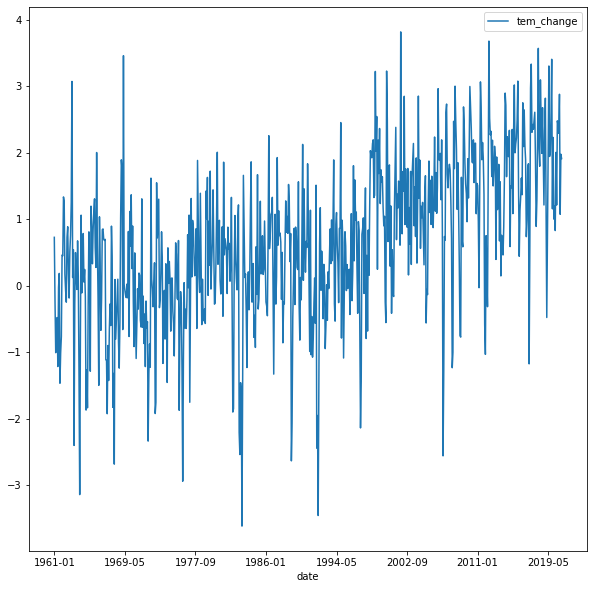

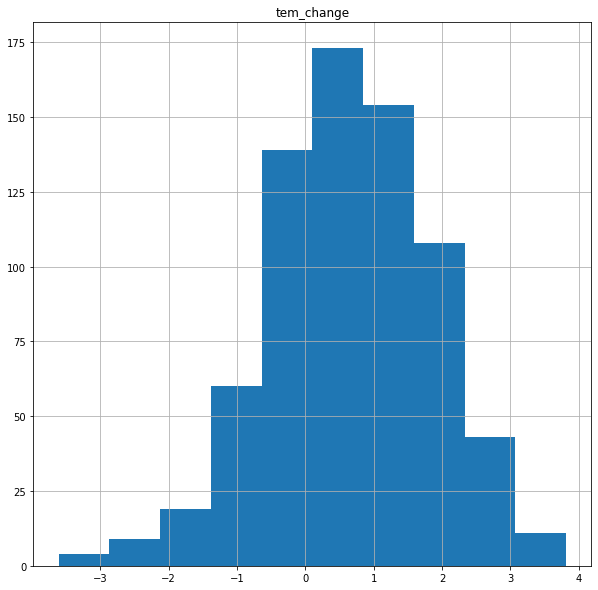

mean1=0.083128, mean2=1.190764
variance1=0.974304, variance2=1.276488
Time Series may be Stationary, since means and variances vary only slightly.

Performing Augmented Dickey-Fuller Test to confirm stationarity...
ADF Statistic: -2.907147
p-value: 0.044523
Time Series is Stationary, since p-value <= 0.05


In [126]:
print ("Stationarity Check for %s" % chosen_Country)
is_stationary = check_stationarity(Country_df)

In [127]:
display(Country_df)

,CountryName,tem_change
date,,
1961-01,Qatar,0.728
1961-02,Qatar,-0.241
1961-03,Qatar,-1.005
1961-04,Qatar,-0.769
1961-05,Qatar,-0.477
...,...,...
2020-08,Qatar,2.290
2020-09,Qatar,2.877
2020-10,Qatar,1.074


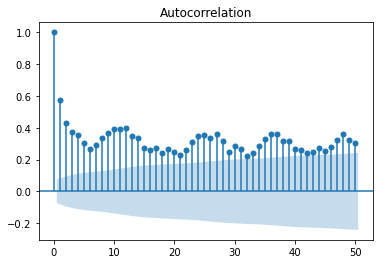

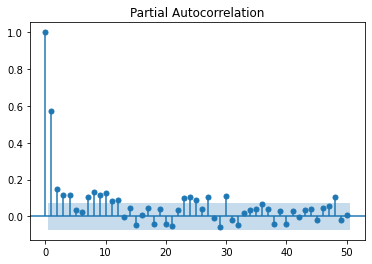

In [128]:
# ACF and PACF plots

plot_acf(Country_df.tem_change,lags = 50)
plot_pacf(Country_df.tem_change,lags = 50)
plt.show()

# setting d value for ARIMA model
if (is_stationary==True):
    d = 0
else:
    d = 1

In [129]:
Country_df = Country_df.filter(items=['tem_change'])

In [130]:
print(Country_df)

         tem_change
date               
1961-01       0.728
1961-02      -0.241
1961-03      -1.005
1961-04      -0.769
1961-05      -0.477
...             ...
2020-08       2.290
2020-09       2.877
2020-10       1.074
2020-11       1.976
2020-12       1.912

[720 rows x 1 columns]


## Linear Regression

In statistics, simple [Linear Regression]("https://en.wikipedia.org/wiki/Linear_regression#:~:text=In%20statistics%2C%20linear%20regression%20is,as%20dependent%20and%20independent%20variables").&text=Such%20models%20are%20called%20linear%20models.) is a linear regression model with a single explanatory variable. That is, it concerns two-dimensional sample points with one independent variable and one dependent variable (conventionally, the x and y coordinates in a Cartesian coordinate system) and finds a linear function (a non-vertical straight line) that, as accurately as possible, predicts the dependent variable values as a function of the independent variable. The adjective simple refers to the fact that the outcome variable is related to a single predictor.

In [131]:
Country_df_lr=Country_df.copy()

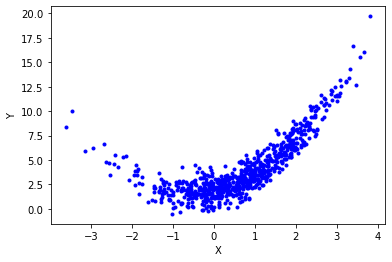

In [132]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import r2_score

X = Country_df_lr
y = 0.8 * X**2 + 0.9*X + 2 + np.random.randn(720, 1)
#equation used -> y = 0.8x^2 + 0.9x + 2
#visualize the data
plt.plot(X, y, 'b.')
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

In [133]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2)

In [134]:
lr = LinearRegression()
lr.fit(x_train, y_train)
y_pred = lr.predict(x_test)
print(r2_score(y_test, y_pred))

0.5957410270622656


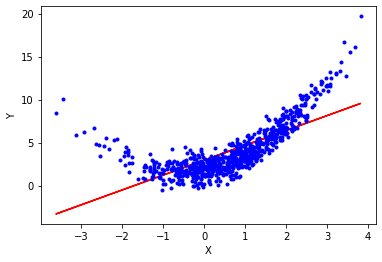

In [135]:
plt.plot(x_train, lr.predict(x_train), color="r")
plt.plot(X, y, "b.")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

## Polynomial Regression

In statistics, [Polynomial Regression](https://en.wikipedia.org/wiki/Polynomial_regression) is a form of regression analysis in which the relationship between the independent variable x and the dependent variable y is modelled as an nth degree polynomial in x. Polynomial regression fits a nonlinear relationship between the value of x and the corresponding conditional mean of y, denoted E(y |x). Although polynomial regression fits a nonlinear model to the data, as a statistical estimation problem it is linear, in the sense that the regression function E(y | x) is linear in the unknown parameters that are estimated from the data. For this reason, polynomial regression is considered to be a special case of multiple linear regression.

In [136]:
#applying polynomial regression degree 2
poly = PolynomialFeatures(degree=2, include_bias=True)
x_train_trans = poly.fit_transform(x_train)
x_test_trans = poly.transform(x_test)
#include bias parameter
lr = LinearRegression()
lr.fit(x_train_trans, y_train)
y_pred = lr.predict(x_test_trans)
print(r2_score(y_test, y_pred))

0.893063957988131


## Autoregression (AR)

In statistics, econometrics and signal processing, an [Autoregressive](https://en.wikipedia.org/wiki/Autoregressive_model) (AR) model is a representation of a type of random process; as such, it is used to describe certain time-varying processes in nature, economics, etc. The autoregressive model specifies that the output variable depends linearly on its own previous values and on a stochastic term (an imperfectly predictable term); thus the model is in the form of a stochastic difference equation (or recurrence relation which should not be confused with differential equation).

In [137]:
# Autoregression Modelling
from statsmodels.tsa.ar_model import AutoReg
from random import random
# contrived dataset
Country_df_lr = [x + random() for x in range(1, 100)]
# fit model
model = AutoReg(Country_df_lr, lags=1)
model_fit = model.fit()
# make prediction
yhat = model_fit.predict(len(Country_df_lr), len(Country_df_lr))
print(yhat)

[100.08504576]


In [138]:
Country_df_lr

[1.69026024897104,
 2.1373267741259356,
 3.872952027657987,
 4.09851405480061,
 5.72819786621829,
 6.563388733896025,
 7.0881239605955635,
 8.193185801042539,
 9.210182724398443,
 10.638336989154139,
 11.697178759751388,
 12.840542538241321,
 13.9484733058135,
 14.375865287805837,
 15.599004593349054,
 16.375867560079087,
 17.387518752789383,
 18.557673109696914,
 19.358400895128696,
 20.967057843986915,
 21.958723272380404,
 22.23164607546989,
 23.27218644345351,
 24.281323838752456,
 25.54581496972803,
 26.02212416004939,
 27.303690098363845,
 28.111641109431417,
 29.351538933123315,
 30.51109178473573,
 31.97250488644061,
 32.33542887156118,
 33.76095886438468,
 34.545389913090496,
 35.71844222588965,
 36.718577285058615,
 37.45180489948085,
 38.830169086550356,
 39.35229622836127,
 40.730495083937654,
 41.32828605317699,
 42.94452089933151,
 43.47621634131346,
 44.16300663986933,
 45.38390037441367,
 46.48763895753655,
 47.966701941220975,
 48.92449628916342,
 49.07709311754577,
 5

In [139]:
Country_df_ma = Country_df.copy()
print(Country_df_ma)

         tem_change
date               
1961-01       0.728
1961-02      -0.241
1961-03      -1.005
1961-04      -0.769
1961-05      -0.477
...             ...
2020-08       2.290
2020-09       2.877
2020-10       1.074
2020-11       1.976
2020-12       1.912

[720 rows x 1 columns]


## Moving Average (MA)

In time series analysis, the [moving-average model](https://en.wikipedia.org/wiki/Moving_average) (MA model), also known as moving-average process, is a common approach for modeling univariate time series. The moving-average model specifies that the output variable depends linearly on the current and various past values of a stochastic (imperfectly predictable) term.

In [140]:
# MA example
from statsmodels.tsa.arima.model import ARIMA
from random import random
# contrived dataset
Country_df_ma = [x + random() for x in range(1, 100)]
# fit model
model = ARIMA(Country_df_ma, order=(0, 0, 1))
model_fit = model.fit()
# make prediction
yhat = model_fit.predict(len(Country_df_ma), len(Country_df_ma))
print(yhat)

[76.43372781]


## ARIMA MODEL 

In statistics and econometrics, and in particular in time series analysis, an autoregressive integrated moving average (ARIMA) model is a generalization of an autoregressive moving average [(ARMA)](https://en.wikipedia.org/wiki/Autoregressive_integrated_moving_average) model. Both of these models are fitted to time series data either to better understand the data or to predict future points in the series (forecasting)

In [141]:
 Country_df.index = pd.to_datetime(Country_df.index)
Country_df.index = Country_df.index.to_period('M')

In [142]:
# split into train and test sets
X = Country_df.values
size = int(len(X) * 0.70)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit()
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))


predicted=0.774507, expected=1.176000
predicted=1.088217, expected=0.624000
predicted=0.867268, expected=1.718000
predicted=1.224083, expected=0.321000
predicted=0.787033, expected=1.627000
predicted=1.130147, expected=1.880000
predicted=1.501933, expected=2.138000
predicted=1.620020, expected=0.902000
predicted=1.302297, expected=1.489000
predicted=1.424760, expected=0.740000
predicted=1.241796, expected=1.921000
predicted=1.575744, expected=0.341000
predicted=0.993936, expected=1.270000
predicted=1.093791, expected=2.850000
predicted=1.953058, expected=1.315000
predicted=1.388508, expected=1.889000
predicted=1.680889, expected=0.562000
predicted=1.199480, expected=1.195000
predicted=1.333503, expected=1.023000
predicted=1.323185, expected=1.253000
predicted=1.174428, expected=0.752000
predicted=1.002658, expected=0.315000
predicted=0.666839, expected=1.343000
predicted=1.081274, expected=1.653000
predicted=1.262596, expected=-0.559000
predicted=0.349137, expected=-0.056000
predicted=

In [143]:
print('Test RMSE: %.3f' % rmse)

Test RMSE: 0.959


In [144]:
np.asarray(Country_df)

array([[ 0.728],
       [-0.241],
       [-1.005],
       [-0.769],
       [-0.477],
       [-1.213],
       [-0.022],
       [ 0.186],
       [-1.464],
       [-1.006],
       [-0.761],
       [ 0.462],
       [ 0.451],
       [ 1.335],
       [ 1.265],
       [ 0.174],
       [-0.067],
       [-0.246],
       [ 0.727],
       [ 0.887],
       [ 0.186],
       [-0.184],
       [ 0.511],
       [ 0.755],
       [ 1.253],
       [ 3.07 ],
       [ 0.124],
       [ 0.543],
       [-2.398],
       [-0.277],
       [ 0.499],
       [ 0.143],
       [-0.055],
       [ 0.675],
       [ 0.135],
       [-1.327],
       [-3.137],
       [-0.722],
       [ 1.061],
       [-0.107],
       [ 0.709],
       [ 0.785],
       [ 0.056],
       [ 0.245],
       [-0.164],
       [-1.867],
       [-1.26 ],
       [-1.833],
       [-0.288],
       [ 0.81 ],
       [-0.014],
       [-1.283],
       [ 1.196],
       [ 0.884],
       [ 0.331],
       [ 0.848],
       [ 1.129],
       [ 1.306],
       [ 0.574

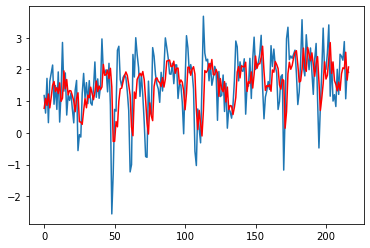

In [145]:
#Model fitting
plt.plot(test)
plt.plot(predictions, color='red')
plt.show()

In [146]:
# fitting an ARIMA model with chosen p, d, q values and calculating the mean squared error
from sklearn.metrics import mean_absolute_error

arima_model = ARIMA(Country_df, order=(1, 0, 1)).fit()
predictions = arima_model.predict(start=0, end=len(Country_df)-1)

mse = mean_squared_error(list(Country_df.tem_change), list(predictions))
print("Mean Squared Error:", mse)

mae = mean_absolute_error(list(Country_df.tem_change), list(predictions))
print("Mean Absolute Error:", mae)

Mean Squared Error: 0.9241637474558405
Mean Absolute Error: 0.730978838234662


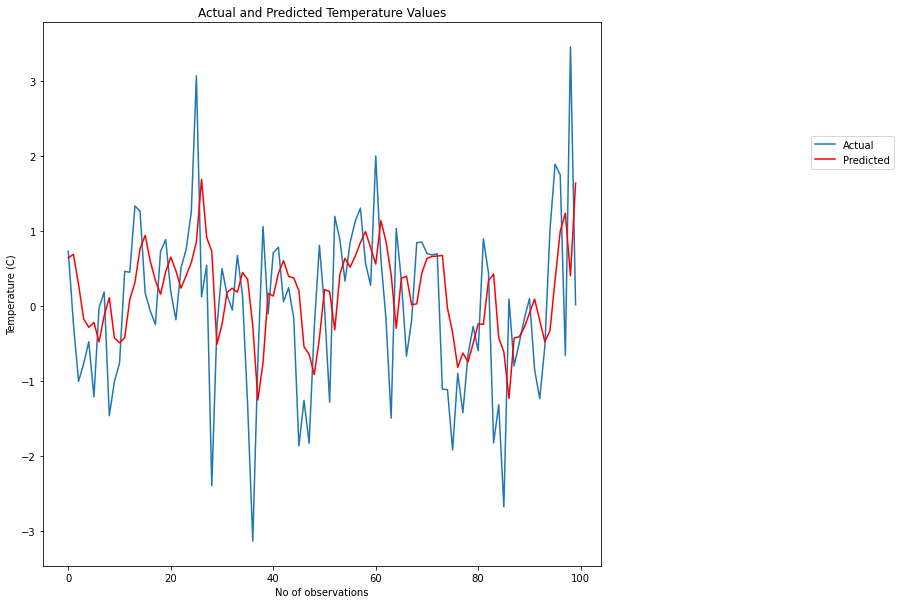

In [147]:
#Samples for looking at fit 
plt.figure(figsize=(10,10))
plt.plot(list(Country_df.tem_change)[:100], label="Actual")
plt.plot(list(predictions)[:100], 'r', label="Predicted")

plt.xlabel("No of observations")
plt.ylabel("Temperature (C)")
plt.title("Actual and Predicted Temperature Values")

plt.legend(loc='upper center', bbox_to_anchor=(1.45, 0.8))
plt.show()

In [148]:
# drop-down menu to select number of years for which predictions are required

years_drop_down_menu = widgets.Dropdown(
    options=list(range(1,101)),
    value=10,
    description='No. of Years:',
    disabled=False,
)

years_drop_down_menu

Dropdown(description='No. of Years:', index=9, options=(1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16,…

In [149]:
num_years = years_drop_down_menu.value
last_month_in_dataset = Country_df.index[-1].month  # gets last month in country_df
remaining_months = 12 - last_month_in_dataset  # months left in current year for that city's data
number_of_steps = remaining_months + num_years * 12  # number of steps to make out-of-sample predictions
out_of_sample_forecast = model_fit.forecast(steps=number_of_steps)#[0]  # predictions
out_of_sample_forecast = out_of_sample_forecast[remaining_months:]  

In [150]:
print(out_of_sample_forecast)

[2.07636259 2.12096338 2.0205134  2.05232537 1.9658411  2.00898724
 2.0226217  2.02846752 2.01818666 2.01848974 2.01465596 2.01724072
 2.01835138 2.01879828 2.01796694 2.01784875 2.01769637 2.01788548
 2.01796808 2.01799177 2.0179284  2.01791248 2.01790822 2.01792339
 2.01792942 2.01793001 2.01792519 2.01792373 2.01792384 2.01792508
 2.01792551 2.01792545 2.01792508 2.01792497 2.01792501 2.01792511
 2.01792514 2.01792512 2.01792509 2.01792509 2.01792509 2.0179251
 2.0179251  2.0179251  2.0179251  2.0179251  2.0179251  2.0179251
 2.0179251  2.0179251  2.0179251  2.0179251  2.0179251  2.0179251
 2.0179251  2.0179251  2.0179251  2.0179251  2.0179251  2.0179251
 2.0179251  2.0179251  2.0179251  2.0179251  2.0179251  2.0179251
 2.0179251  2.0179251  2.0179251  2.0179251  2.0179251  2.0179251
 2.0179251  2.0179251  2.0179251  2.0179251  2.0179251  2.0179251
 2.0179251  2.0179251  2.0179251  2.0179251  2.0179251  2.0179251
 2.0179251  2.0179251  2.0179251  2.0179251  2.0179251  2.0179251
 2.0

In [151]:
# displaying forecasted values for the nth year

months = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"]
i = 0
for x in out_of_sample_forecast[-12:]:  # last year
    print(months[i]+": ", x, 'C')
    i += 1

January:  2.0179250974186522 C
February:  2.0179250974186522 C
March:  2.0179250974186522 C
April:  2.0179250974186522 C
May:  2.0179250974186522 C
June:  2.0179250974186522 C
July:  2.0179250974186522 C
August:  2.0179250974186522 C
September:  2.0179250974186522 C
October:  2.0179250974186522 C
November:  2.0179250974186522 C
December:  2.0179250974186522 C


In [152]:
# plotting the predicted values for the nth year

trace = go.Scatter(
    x = ["January", "February", "March", "April", "May", "June", "July", "August", "September", "October", "November", "December"],
    y = out_of_sample_forecast[-12:],
    mode = 'lines',
    name = 'Difference in Temperature (C)'
)

layout = go.Layout(
    title='Predicted Temperatures for the Year %d' % (2020+num_years),
    xaxis=dict(
        title='Year',
    ),
    yaxis=dict(
        title='Temperature (C)',
    )
)
data = [trace]

fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [153]:
# plotting monthly temperature changes from 2013 to 2013+n years

#fig, ax = plt.subplots(nrows=4, ncols=3)

monthly_change = {}

for month in range(12):
    temp = month
    for year in range(num_years):
        if month not in monthly_change:
            monthly_change[month] = [out_of_sample_forecast[temp]]
        else:
            monthly_change[month].append(out_of_sample_forecast[temp])
        temp+=12

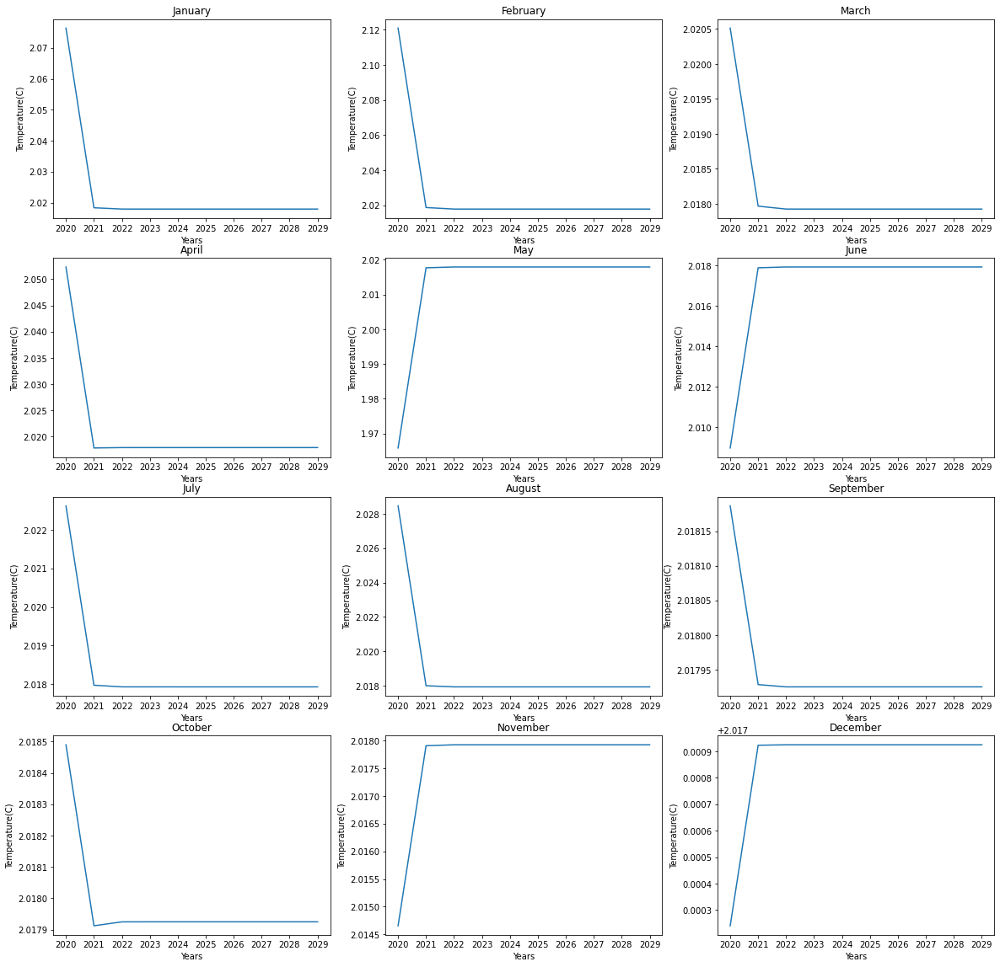

In [154]:
plt.figure(figsize=(20,20))
for pos in range(0,12):
    plt.subplot(4,3,pos+1)
    plt.plot(monthly_change[pos])
    plt.xticks(np.array(range(num_years)), [i for i in range(2020,2020+num_years)])
    plt.title(months[pos])
    plt.xlabel('Years')
    plt.ylabel('Temperature(C)')

plt.show()

## Conclusion



We can tell from this project that there will be a 2°C difference in temperature in the future, which is significant. While a 2°C or 3°C temperature change may not appear to be significant, it has far-reaching repercussions on a global scale since it might affect the sustainability of water, food supplies, ecosystems, coastal stability, and public health.